Importing and creating the dataframes

In [105]:
#data processing
import numpy as np
import pandas as pd

#audio processing and visualization
import librosa
import librosa.display 
import matplotlib.pyplot as plt
import IPython.display as ipd

#ignore warnings
import warnings
import os

#importing packages used for machine learning
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import cross_val_predict
import sklearn.metrics as skm

In [63]:
#removing warnings that i dont care about
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')

In [64]:
#all data is in a subfolder called data. the directory is relative to the notebook.
data_dir = "data"

#function to create a dataframe from the music files
def create_dataframe(dir):
    mood = []
    audio = []
    for root, dirs, files in os.walk(dir):
        for name in files:
            if name.endswith((".wav")): #only accept wav files due to the way librosa works
                mood.append(os.path.basename(root))
                audio.append(os.path.join(root, name))
    df = pd.DataFrame(columns=["audio", "mood"])
    df["audio"] = audio
    df["mood"] = mood
    return df

df = create_dataframe(data_dir)

In [65]:
#verify that the dataframe was created correctly
df.head()

,audio,mood
0,data/happy/19012.wav,happy
1,data/happy/19774.wav,happy
2,data/happy/17995.wav,happy
3,data/happy/19760.wav,happy
4,data/happy/18330.wav,happy


Playing around with the data

In [66]:
#ensuring that we have loaded all of the data
df["mood"].value_counts()

happy         500
sad           500
dramatic      500
aggressive    500
romantic      500
Name: mood, dtype: int64

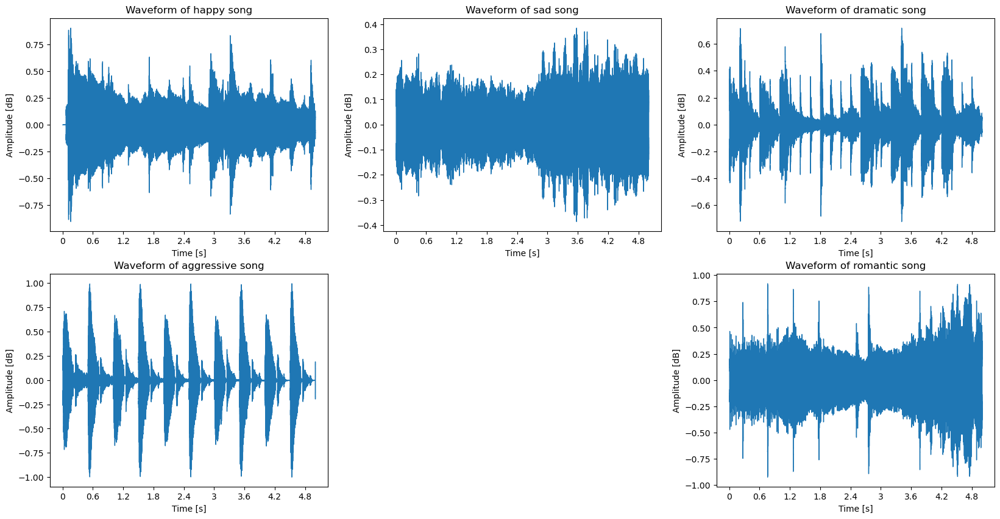

In [67]:
#plotting the signals of one window in each category
sig0, sr0 = librosa.load(df["audio"][0], sr=22050)
sig1, sr1 = librosa.load(df["audio"][500], sr=22050)
sig2, sr2 = librosa.load(df["audio"][1000], sr=22050)
sig3, sr3 = librosa.load(df["audio"][1500], sr=22050)
sig4, sr4 = librosa.load(df["audio"][2000], sr=22050)

#visualizing the signals
fig = plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
librosa.display.waveshow(sig0, sr=sr0)
plt.title("Waveform of happy song")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude [dB]")

plt.subplot(2, 3, 2)
librosa.display.waveshow(sig1, sr=sr1)
plt.title("Waveform of sad song")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude [dB]")

plt.subplot(2, 3, 3)
librosa.display.waveshow(sig2, sr=sr2)
plt.title("Waveform of dramatic song")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude [dB]")

plt.subplot(2, 3, 4)
librosa.display.waveshow(sig3, sr=sr3)
plt.title("Waveform of aggressive song")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude [dB]")

plt.subplot(2, 3, 6)
librosa.display.waveshow(sig4, sr=sr4)
plt.title("Waveform of romantic song")
plt.xlabel("Time [s]")
plt.ylabel("Amplitude [dB]")

plt.show()

In [68]:
#playing the above samples
print("happy: ")
ipd.display(ipd.Audio(df["audio"][0])) #using ipd.display, then ipd.Audio allows us to output all audio files in a single cell
print("sad: ")
ipd.display(ipd.Audio(df["audio"][500]))
print("dramatic: ")
ipd.display(ipd.Audio(df["audio"][1000]))
print("aggressive: ")
ipd.display(ipd.Audio(df["audio"][1500]))
print("romantic: ")
ipd.display(ipd.Audio(df["audio"][2000]))


happy: 


sad: 


dramatic: 


aggressive: 


romantic: 


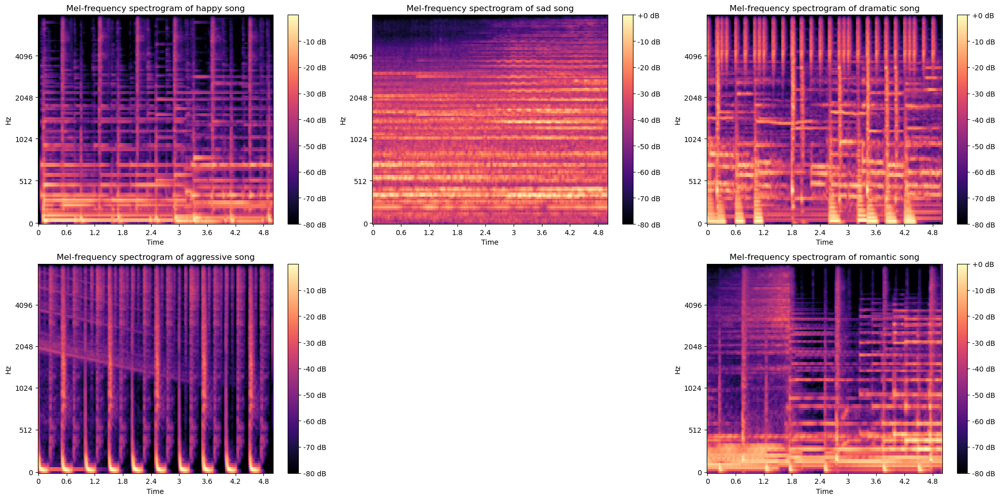

In [69]:
S0 = librosa.feature.melspectrogram(y=sig0, sr=sr0)
S1 = librosa.feature.melspectrogram(y=sig1, sr=sr1)
S2 = librosa.feature.melspectrogram(y=sig2, sr=sr2)
S3 = librosa.feature.melspectrogram(y=sig3, sr=sr3)
S4 = librosa.feature.melspectrogram(y=sig4, sr=sr4)

#visualizing the mel spectrograms of one window in each category
fig = plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
librosa.display.specshow(librosa.power_to_db(S0, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-frequency spectrogram of happy song')
plt.tight_layout()

plt.subplot(2, 3, 2)
librosa.display.specshow(librosa.power_to_db(S1, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-frequency spectrogram of sad song')
plt.tight_layout()

plt.subplot(2, 3, 3)
librosa.display.specshow(librosa.power_to_db(S2, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-frequency spectrogram of dramatic song')
plt.tight_layout()

plt.subplot(2, 3, 4)
librosa.display.specshow(librosa.power_to_db(S3, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-frequency spectrogram of aggressive song')
plt.tight_layout()

plt.subplot(2, 3, 6)
librosa.display.specshow(librosa.power_to_db(S4, ref=np.max), y_axis='mel', fmax=8000, x_axis='time')
plt.colorbar(format='%+2.0f dB')
plt.title('Mel-frequency spectrogram of romantic song')
plt.tight_layout()

plt.show()

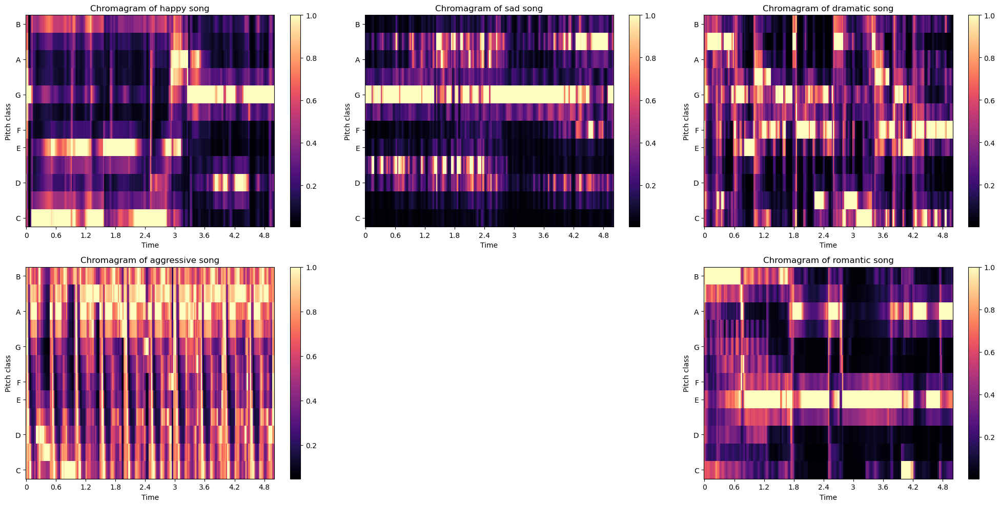

In [70]:
chroma0 = librosa.feature.chroma_stft(y=sig0, sr=sr0)
chroma1 = librosa.feature.chroma_stft(y=sig1, sr=sr1)
chroma2 = librosa.feature.chroma_stft(y=sig2, sr=sr2)
chroma3 = librosa.feature.chroma_stft(y=sig3, sr=sr3)
chroma4 = librosa.feature.chroma_stft(y=sig4, sr=sr4)

#visualizing the chromagrams of one window in each category
fig = plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
librosa.display.specshow(chroma0, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram of happy song')
plt.tight_layout()

plt.subplot(2, 3, 2)
librosa.display.specshow(chroma1, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram of sad song')
plt.tight_layout()

plt.subplot(2, 3, 3)
librosa.display.specshow(chroma2, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram of dramatic song')
plt.tight_layout()

plt.subplot(2, 3, 4)
librosa.display.specshow(chroma3, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram of aggressive song')
plt.tight_layout()

plt.subplot(2, 3, 6)
librosa.display.specshow(chroma4, y_axis='chroma', x_axis='time')
plt.colorbar()
plt.title('Chromagram of romantic song')
plt.tight_layout()

plt.show()

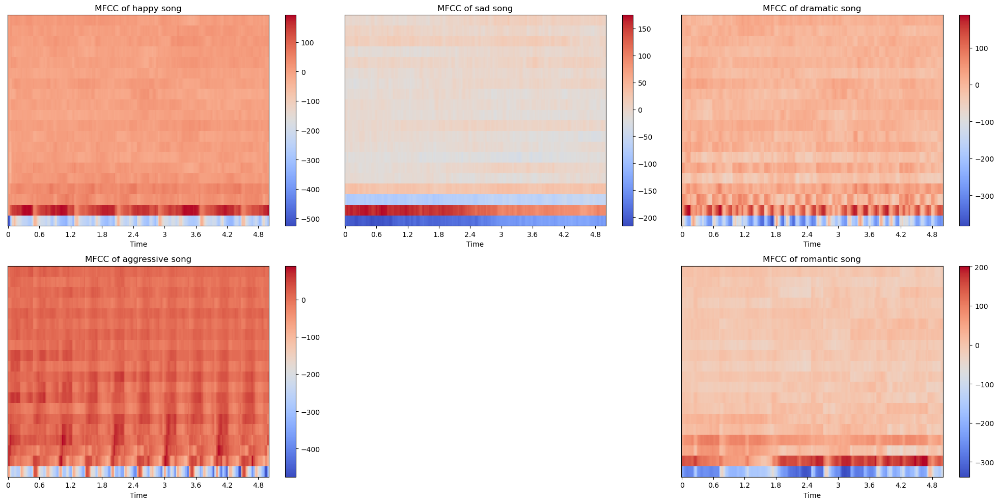

In [71]:
mfcc0 = librosa.feature.mfcc(y=sig0, sr=sr0)
mfcc1 = librosa.feature.mfcc(y=sig1, sr=sr1)
mfcc2 = librosa.feature.mfcc(y=sig2, sr=sr2)
mfcc3 = librosa.feature.mfcc(y=sig3, sr=sr3)
mfcc4 = librosa.feature.mfcc(y=sig4, sr=sr4)

#visualizing the mfccs of one window in each category
fig = plt.figure(figsize=(20, 10))

plt.subplot(2, 3, 1)
librosa.display.specshow(mfcc0, x_axis='time')
plt.colorbar()
plt.title('MFCC of happy song')
plt.tight_layout()

plt.subplot(2, 3, 2)
librosa.display.specshow(mfcc1, x_axis='time')
plt.colorbar()
plt.title('MFCC of sad song')
plt.tight_layout()

plt.subplot(2, 3, 3)
librosa.display.specshow(mfcc2, x_axis='time')
plt.colorbar()
plt.title('MFCC of dramatic song')
plt.tight_layout()

plt.subplot(2, 3, 4)
librosa.display.specshow(mfcc3, x_axis='time')
plt.colorbar()
plt.title('MFCC of aggressive song')
plt.tight_layout()

plt.subplot(2, 3, 6)
librosa.display.specshow(mfcc4, x_axis='time')
plt.colorbar()
plt.title('MFCC of romantic song')
plt.tight_layout()

plt.show()

In [72]:
#extracting 

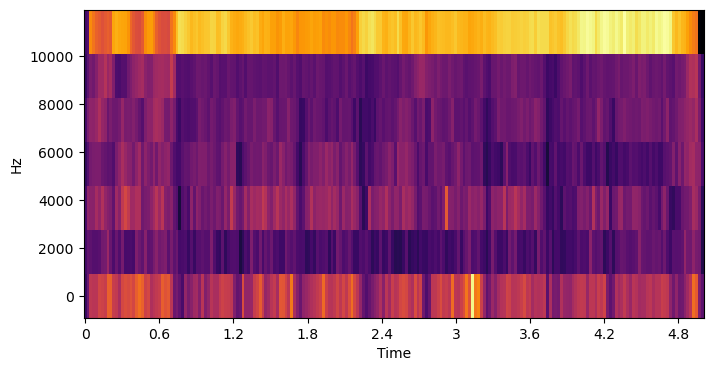

In [73]:
#band energy ratio of an audio file
ber = librosa.feature.spectral_contrast(signal, sr=srate) #spectral contrast is what i think is the band energy ratio
plt.figure(figsize=(8, 4))
librosa.display.specshow(ber, x_axis="time", y_axis="hz", cmap="inferno")

Feature Extraction

In [77]:
#the model will be trained on the following features:
#mel spectrogram - frequency of the signal
#chromagram - pitch of the signal
#mfccs - timbre of the signal
#band energy ratio - energy of the signal
#zero crossing rate - how often the signal crosses the x axis
#tempo - the tempo of the signal

#for mfcc, chroma, mel spectrogram, band energy ratio, and zero crossing rate, we will use the mean of each feature.

#function to extract features from an audio file
def extractFeatures(file):
    signal, srate = librosa.load(file)
    tempo = librosa.beat.tempo(y=signal)
    output = np.array(tempo)

    mel = np.mean(librosa.feature.melspectrogram(y=signal).T, axis=0) #transposing so we can use it with hstack
    output = np.hstack((output, mel))

    chroma = np.mean(librosa.feature.chroma_stft(y=signal, sr=srate).T, axis=0)
    output = np.hstack((output, chroma))

    mfcc = np.mean(librosa.feature.mfcc(y=signal, sr=srate).T, axis=0)
    output = np.hstack((output, mfcc))

    ber = np.mean(librosa.feature.spectral_contrast(signal, sr=srate).T, axis=0)
    output = np.hstack((output, ber))

    zcr = np.mean(librosa.feature.zero_crossing_rate(signal).T, axis=0)
    output = np.hstack((output, zcr))

    return output


print(extractFeatures(df.iloc[0, 0]))



[ 1.51999081e+02  7.87888527e+00  2.29532120e+02  1.88234573e+02
  6.31617241e+01  4.12176208e+01  5.27493620e+00  1.75032246e+00
  4.29290390e+00  4.68878412e+00  2.33020992e+01  1.50774422e+01
  2.19193935e+01  4.54887619e+01  2.96934295e+00  2.67138996e+01
  8.02571774e+00  2.31205273e+00  6.83228254e-01  1.27922714e+00
  1.69020023e+01  6.54037762e+00  7.40191281e-01  2.22336149e+00
  1.26513615e-01  1.29009354e+00  1.76965642e+00  1.04726136e-01
  2.01002985e-01  3.68722171e-01  1.21887379e+01  1.11296587e+01
  1.62111655e-01  3.26524675e-01  2.76489997e+00  9.42953885e-01
  4.81875576e-02  3.10139172e-02  1.69197619e-01  1.32749870e-01
  3.89104635e-01  4.24662620e-01  3.94498296e-02  6.35020882e-02
  7.67155364e-02  1.52021125e-01  4.96696457e-02  4.04808708e-02
  4.92379926e-02  1.67939663e-01  1.01961650e-01  5.50054498e-02
  5.62145784e-02  5.75175136e-02  4.49012928e-02  1.05117619e-01
  3.66762698e-01  9.05317590e-02  1.50001317e-01  2.21057106e-02
  1.44117162e-01  7.44700

In [80]:
print("Extracting Features...")
X, y = [], []

for i, row in df.iterrows():
    label = row["mood"]
    features = extractFeatures(row["audio"])
    X.append(features)
    y.append(label)
    if i % 100 == 0:
        print("#", end="")
print("\ndone")

Extracting Features...
#########################
done


In [85]:
X  = np.array(X)
y = np.array(y)
X,y

(array([[1.51999081e+02, 7.87888527e+00, 2.29532120e+02, ...,
         2.10843665e+01, 5.06275234e+01, 3.86013455e-02],
        [1.61499023e+02, 4.11222725e+01, 2.62325012e+02, ...,
         1.78270351e+01, 5.32605447e+01, 1.19185836e-01],
        [1.29199219e+02, 7.14676237e+00, 1.08398209e+02, ...,
         1.51532899e+01, 5.27475442e+01, 4.43838614e-02],
        ...,
        [1.17453835e+02, 4.10498112e-01, 5.57748497e-01, ...,
         1.83356804e+01, 4.88877789e+01, 3.09990777e-02],
        [1.03359375e+02, 5.71885049e-01, 7.29099393e-01, ...,
         1.91413886e+01, 4.87231293e+01, 2.80038339e-02],
        [1.23046875e+02, 9.76080477e-01, 3.22349510e+01, ...,
         1.96295793e+01, 5.09524271e+01, 4.10178856e-02]]),
 array(['happy', 'happy', 'happy', ..., 'romantic', 'romantic', 'romantic'],
       dtype='<U10'))

In [164]:
dataframe = pd.DataFrame(data = X[1:, 1:], 
                         columns = X [0, 1:])
dataframe["target"] = y[1:]
dataframe.to_csv("output/features.csv", index = False)

Splitting the data into train and test

In [86]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2) #20% of the data will be used for testing.
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)


(2000, 169) (500, 169) (2000,) (500,)


In [102]:
#encoding the labels so that they are in the form of numbers
encoder = OrdinalEncoder()
y_train_oe = encoder.fit_transform(y_train.reshape(-1, 1))
y_test_oe = encoder.transform(y_test.reshape(-1, 1))

array([[3.],
       [0.],
       [1.],
       ...,
       [3.],
       [3.],
       [0.]])

In [144]:
#creating a function that will compare the predictions to the actual labels
def matrixPlot(y_train, y_pred):
    ConfusionMatrixDisplay.from_predictions(y_train, y_pred)
    ConfusionMatrixDisplay.from_predictions(y_train, y_pred, normalize="true", values_format=".0%")
    print(skm.classification_report(y_train, y_pred, digits=3))
    print(skm.precision_recall_fscore_support(y_train, y_pred, average="macro"))

Making predictions using the RandomForestClassifier model

              precision    recall  f1-score   support

         0.0      0.976     0.986     0.981       414
         1.0      0.959     0.914     0.936       409
         2.0      0.979     0.981     0.980       372
         3.0      0.889     0.902     0.896       400
         4.0      0.908     0.926     0.917       405

    accuracy                          0.942      2000
   macro avg      0.942     0.942     0.942      2000
weighted avg      0.942     0.942     0.942      2000

(0.9421512138329977, 0.9419082791749045, 0.9418914537424625, None)


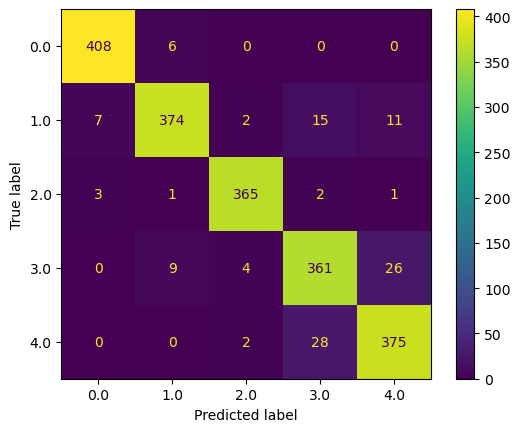

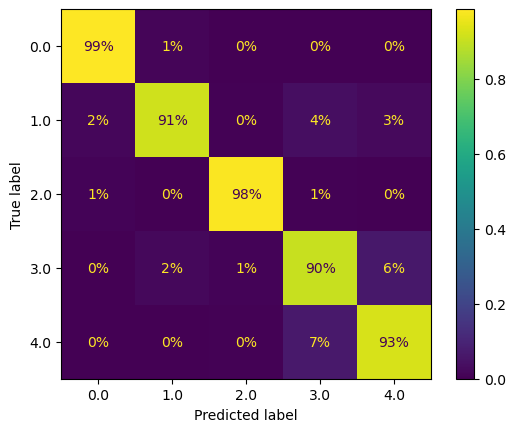

In [145]:
randomForestClassifier = RandomForestClassifier()
randomForestClassifier.fit(X_train, y_train_oe)
y_train_pred = cross_val_predict(randomForestClassifier, X_train, y_train_oe, cv=3)

y_train_pred
matrixPlot(y_train_oe, y_train_pred)

              precision    recall  f1-score   support

         0.0      0.976     0.969     0.972       414
         1.0      0.946     0.941     0.944       409
         2.0      0.917     0.919     0.918       372
         3.0      0.832     0.843     0.837       400
         4.0      0.864     0.862     0.863       405

    accuracy                          0.907      2000
   macro avg      0.907     0.907     0.907      2000
weighted avg      0.907     0.907     0.907      2000

(0.9068930555404607, 0.9067005121972729, 0.9067860243055138, None)


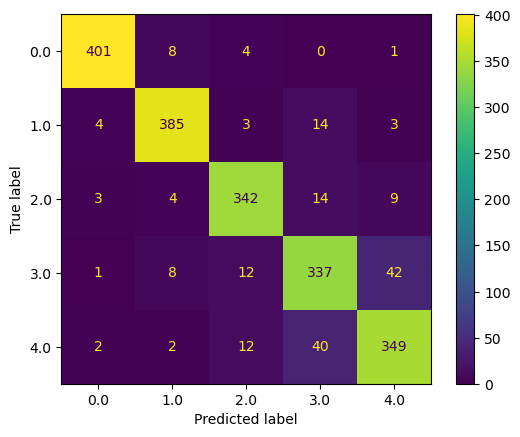

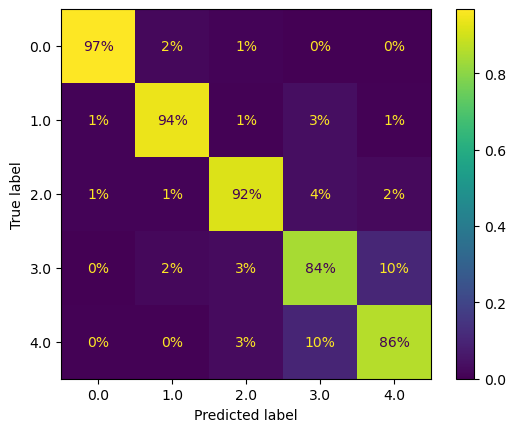

In [165]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_val_predict


scaler = StandardScaler()
lr = LogisticRegression(max_iter=400)
lr_pipeline = make_pipeline(scaler, lr)

y_train_pred = cross_val_predict(lr_pipeline, X_train, y_train_oe, cv=3)

y_train_pred
matrixPlot(y_train_oe, y_train_pred)

Evaluating the model performance

              precision    recall  f1-score   support

         0.0      0.989     1.000     0.994        86
         1.0      0.955     0.934     0.944        91
         2.0      1.000     1.000     1.000       128
         3.0      0.902     0.920     0.911       100
         4.0      0.947     0.937     0.942        95

    accuracy                          0.960       500
   macro avg      0.958     0.958     0.958       500
weighted avg      0.960     0.960     0.960       500

(0.9584662443707483, 0.9581816078658184, 0.9582708257062975, None)


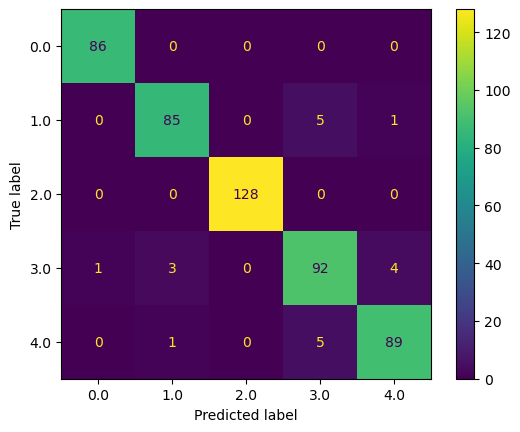

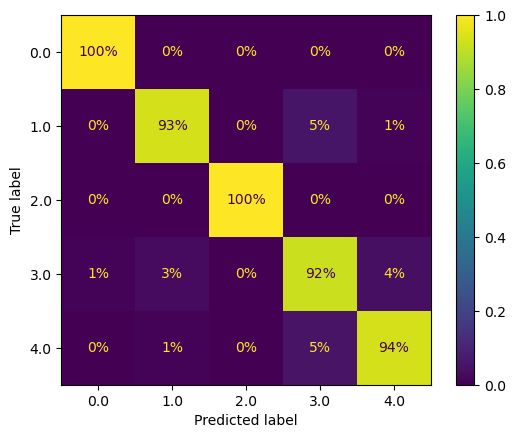

In [176]:
#testing the model on the test data
model = randomForestClassifier
y_test_pred = model.predict(X_test)
matrixPlot(y_test_oe, y_test_pred)

Making it possible to predict the class of a new song

In [179]:
#extracting features from the song
def predictNewSong(song):
    song_features = extractFeatures(song)
    song_features = np.array(song_features).reshape(1, -1)
    #predicting the mood of the song
    song_mood = model.predict(song_features)
    song_mood = encoder.inverse_transform(song_mood.reshape(-1, 1))
    print("The mood of the song is", song_mood[0])

In [183]:
song_path = "testing_input/clean_jars.mp3"
ipd.display(ipd.Audio(song_path))
predictNewSong(song_path)

The mood of the song is ['aggressive']
